# GWASLAB VISUALIZATIONS

### Import data and libraries

In [45]:
import gwaslab as gl
import pandas as pd
import matplotlib.pyplot as plt

In [34]:
test_ldsc = pd.read_csv("/home/maria/git/SOROLLA/Results/CONTROLS/ldsc_genetic_correlation.csv")
ldsc = pd.read_csv("/home/maria/git/SOROLLA/Results/ldsc_genetic_correlation_corrected.csv")

In [35]:
test_ldsc.head()

,condition1,dataset1,condition2,dataset2,rg,se,z,p,h2_obs,h2_obs_se,h2_int,h2_int_se,gcov_int,gcov_int_se
0,Bip,BIP2012,TRY,GCST000758,0.0256,0.0630,0.4060,0.6847,0.1377,0.0287,0.8914,0.0225,-0.0127,0.0081
1,SCZ,SCZ2014,Obesity,GCST001475,-0.0364,0.0451,-0.8056,0.4205,0.3532,0.0451,0.9374,0.0087,-0.0008,0.0070
2,SCZ,SCZ2014,College,GCST008396,0.0984,0.0419,2.3491,0.0188,0.0711,0.0063,1.0535,0.0107,-0.0064,0.0080
3,BMI,GCST002783,BMI,RA,0.0253,0.0325,0.7776,0.4368,0.2344,0.0822,0.9364,0.0172,-0.0050,0.0052
4,TRY,GCST000758,trigly,T2D-M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
test_ldsc = test_ldsc.rename(columns={"condition1":"p1", "condition2":"p2"})
ldsc = ldsc.rename(columns={"label_1":"p1", "label_2":"p2"})

In [37]:
print(test_ldsc.columns.tolist())
print(ldsc.columns.tolist())

['p1', 'dataset1', 'p2', 'dataset2', 'rg', 'se', 'z', 'p', 'h2_obs', 'h2_obs_se', 'h2_int', 'h2_int_se', 'gcov_int', 'gcov_int_se']
['id_1', 'p1', 'id_2', 'p2', 'rg', 'se', 'z', 'p', 'h2_obs', 'h2_obs_se', 'h2_int', 'h2_int_se', 'gcov_int', 'gcov_int_se', 'adjusted_p_by', 'adjusted_p_bh']


In [51]:
ldsc_p_uncorrected = ldsc[ldsc["p"] <= 0.05]
ldsc_p_bh = ldsc[ldsc["adjusted_p_bh"] <= 0.05]
ldsc_p_by = ldsc[ldsc["adjusted_p_by"] <= 0.05]
print(len(ldsc))
print(len(ldsc_p_uncorrected))
print(len(ldsc_p_bh))
print(len(ldsc_p_by))

2016
796
693
562


## Heatmap

In [54]:
plt.rcParams['font.serif'] = ['Times New Roman']

2024/07/01 17:08:23 Start to create ldsc genetic correlation heatmap...
2024/07/01 17:08:23 Raw dataset records: 2016
2024/07/01 17:08:23  -Raw dataset non-NA records: 2016
2024/07/01 17:08:23 Filling diagnal line and duplicated pair for plotting...
2024/07/01 17:08:23  -Diagnal records: 62
2024/07/01 17:08:23 Valid unique trait pairs: 2016
2024/07/01 17:08:23  -Valid unique trait1: 63
2024/07/01 17:08:23  -Valid unique trait2: 63
2024/07/01 17:08:23  -Significant correlations with P < 0.05: 796
2024/07/01 17:08:23  -Significant correlations after Bonferroni correction: 431
2024/07/01 17:08:23  -Significant correlations with FDR <0.05: 693
2024/07/01 17:08:23 Plotting heatmap...
2024/07/01 17:08:24 Full cell : non-corrected P == 0.05


2024/07/01 17:08:25 P value annotation text (Order: Bon -> FDR -> Pnom): 
2024/07/01 17:08:25  -* : non-corrected P < 0.05 
2024/07/01 17:08:26 Start to save figure...
2024/07/01 17:08:26  -Skip saving figure!
2024/07/01 17:08:26 Finished saving figure...
2024/07/01 17:08:26 Finished creating ldsc genetic correlation heatmap!


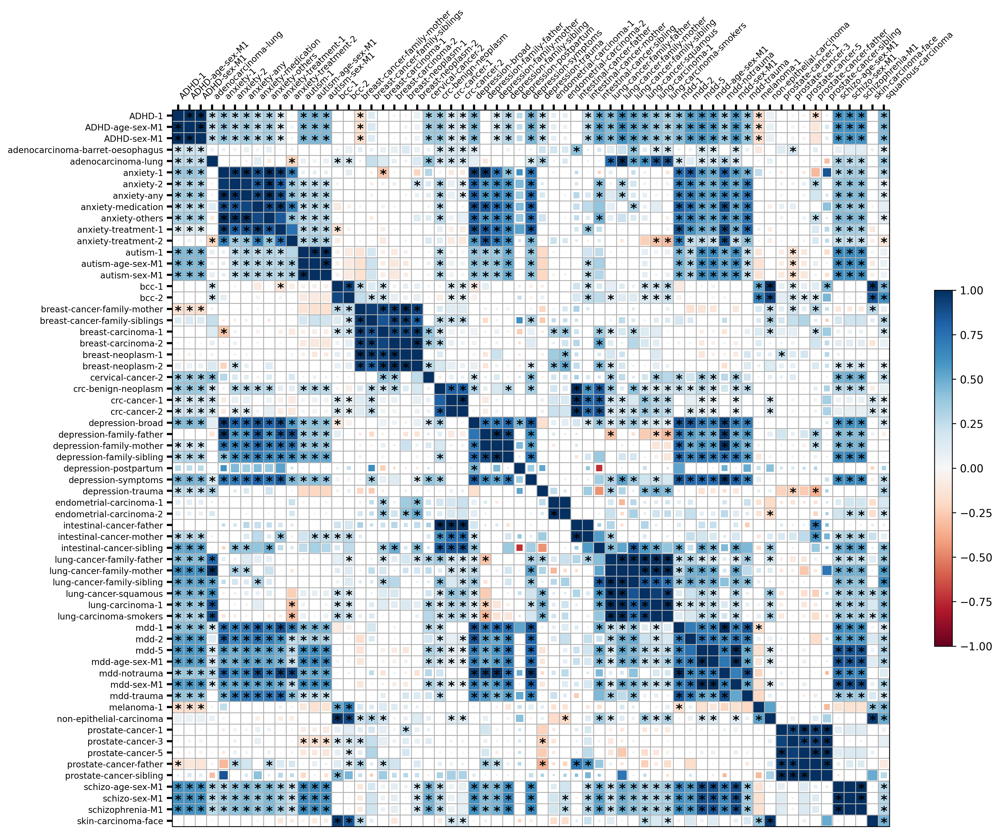

In [55]:
ldsc_unfiltered_uncorrected_heatmap = gl.plot_rg( ldsc,
            p="p",
            p1="p1",
            p2="p2", 
            sig_levels=[0.05],
            corrections =["non"],
            full_cell=("non",0.05),
            panno_texts=["*"],
            panno_args={"size":12,"c":"black"},
            fig_args={"figsize":(15,15),"dpi":300},
            colorbar_args={"shrink":0.4},
            fontsize=8
            )


2024/07/01 17:09:56 Start to create ldsc genetic correlation heatmap...
2024/07/01 17:09:56 Raw dataset records: 2016
2024/07/01 17:09:56  -Raw dataset non-NA records: 2016
2024/07/01 17:09:56 Filling diagnal line and duplicated pair for plotting...
2024/07/01 17:09:56  -Diagnal records: 62
2024/07/01 17:09:56 Valid unique trait pairs: 2016
2024/07/01 17:09:56  -Valid unique trait1: 63
2024/07/01 17:09:56  -Valid unique trait2: 63
2024/07/01 17:09:56  -Significant correlations with P < 0.05: 796
2024/07/01 17:09:56  -Significant correlations after Bonferroni correction: 431
2024/07/01 17:09:56  -Significant correlations with FDR <0.05: 693
2024/07/01 17:09:56 Plotting heatmap...
2024/07/01 17:09:56 Full cell : non-corrected P == 0.05
2024/07/01 17:09:58 P value annotation text (Order: Bon -> FDR -> Pnom): 
2024/07/01 17:09:58  -* : bon-corrected P < 0.05 


2024/07/01 17:09:59 Start to save figure...
2024/07/01 17:09:59  -Skip saving figure!
2024/07/01 17:09:59 Finished saving figure...
2024/07/01 17:09:59 Finished creating ldsc genetic correlation heatmap!


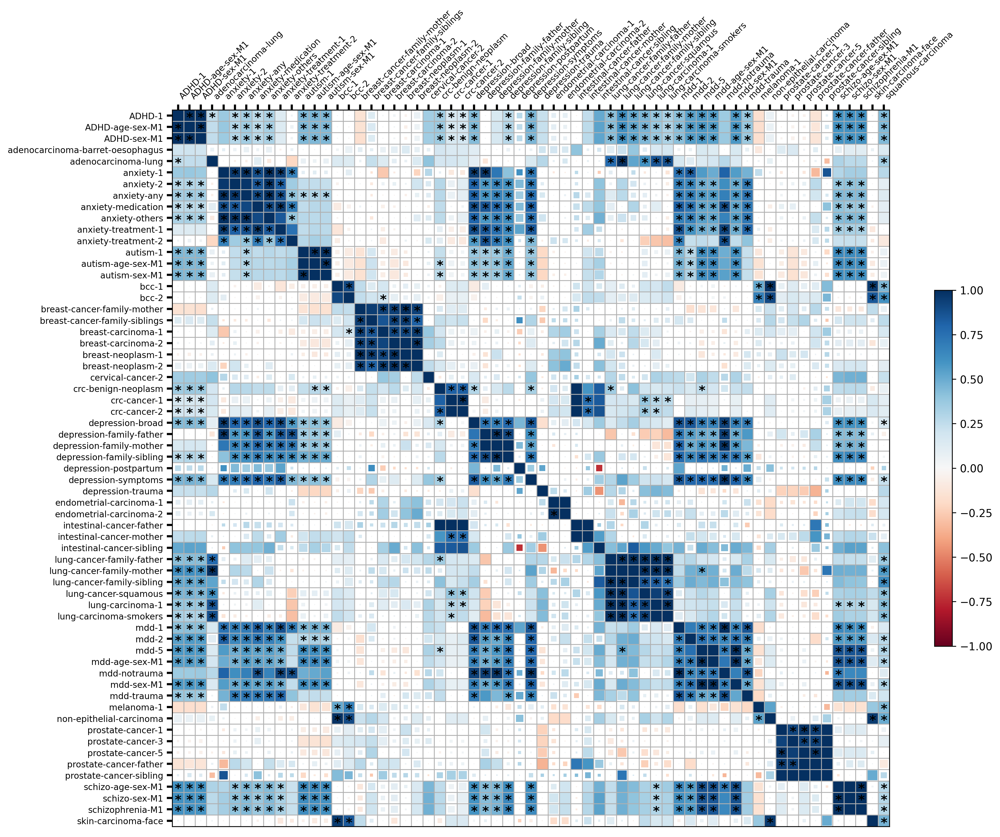

In [57]:
ldsc_unfiltered_bonferroni_heatmap = gl.plot_rg( ldsc,
            p="p",
            p1="p1",
            p2="p2", 
            sig_levels=[0.05],
            corrections =["bon"],
            full_cell=("non",0.05),
            panno_texts=["*"],
            panno_args={"size":12,"c":"black"},
            fig_args={"figsize":(15,15),"dpi":300},
            colorbar_args={"shrink":0.4},
            fontsize=8
            )


2024/07/01 17:10:39 Start to create ldsc genetic correlation heatmap...
2024/07/01 17:10:39 Raw dataset records: 2016
2024/07/01 17:10:39  -Raw dataset non-NA records: 2016
2024/07/01 17:10:39 Filling diagnal line and duplicated pair for plotting...
2024/07/01 17:10:39  -Diagnal records: 62
2024/07/01 17:10:39 Valid unique trait pairs: 2016
2024/07/01 17:10:39  -Valid unique trait1: 63
2024/07/01 17:10:39  -Valid unique trait2: 63
2024/07/01 17:10:39  -Significant correlations with P < 0.05: 796
2024/07/01 17:10:39  -Significant correlations after Bonferroni correction: 431
2024/07/01 17:10:39  -Significant correlations with FDR <0.05: 693
2024/07/01 17:10:39 Plotting heatmap...
2024/07/01 17:10:39 Full cell : non-corrected P == 0.05


2024/07/01 17:10:41 P value annotation text (Order: Bon -> FDR -> Pnom): 
2024/07/01 17:10:41  -* : fdr-corrected P < 0.05 
2024/07/01 17:10:41 Start to save figure...
2024/07/01 17:10:41  -Skip saving figure!
2024/07/01 17:10:41 Finished saving figure...
2024/07/01 17:10:41 Finished creating ldsc genetic correlation heatmap!


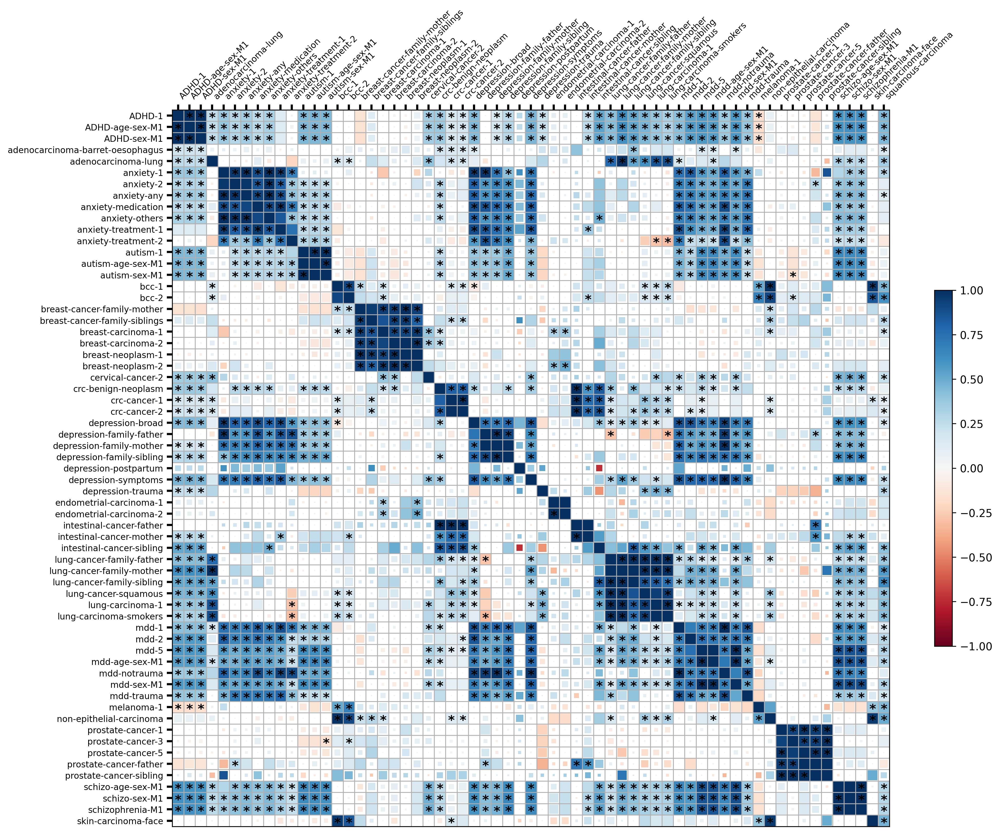

In [58]:
ldsc_unfiltered_fdr_heatmap = gl.plot_rg( ldsc,
            p="p",
            p1="p1",
            p2="p2", 
            sig_levels=[0.05],
            corrections =["fdr"],
            full_cell=("non",0.05),
            panno_texts=["*"],
            panno_args={"size":12,"c":"black"},
            fig_args={"figsize":(15,15),"dpi":300},
            colorbar_args={"shrink":0.4},
            fontsize=8
            )


2024/07/01 17:11:24 Start to create ldsc genetic correlation heatmap...
2024/07/01 17:11:24 Raw dataset records: 2016
2024/07/01 17:11:24  -Raw dataset non-NA records: 2016
2024/07/01 17:11:24 Filling diagnal line and duplicated pair for plotting...
2024/07/01 17:11:24  -Diagnal records: 62
2024/07/01 17:11:24 Valid unique trait pairs: 2016
2024/07/01 17:11:24  -Valid unique trait1: 63
2024/07/01 17:11:24  -Valid unique trait2: 63
2024/07/01 17:11:24  -Significant correlations with P < 0.05: 693
2024/07/01 17:11:24  -Significant correlations after Bonferroni correction: 400
2024/07/01 17:11:24  -Significant correlations with FDR <0.05: 599
2024/07/01 17:11:24 Plotting heatmap...
2024/07/01 17:11:24 Full cell : non-corrected P == 0.05


2024/07/01 17:11:26 P value annotation text (Order: Bon -> FDR -> Pnom): 
2024/07/01 17:11:26  -* : non-corrected P < 0.05 
2024/07/01 17:11:26 Start to save figure...
2024/07/01 17:11:26  -Skip saving figure!
2024/07/01 17:11:26 Finished saving figure...
2024/07/01 17:11:26 Finished creating ldsc genetic correlation heatmap!


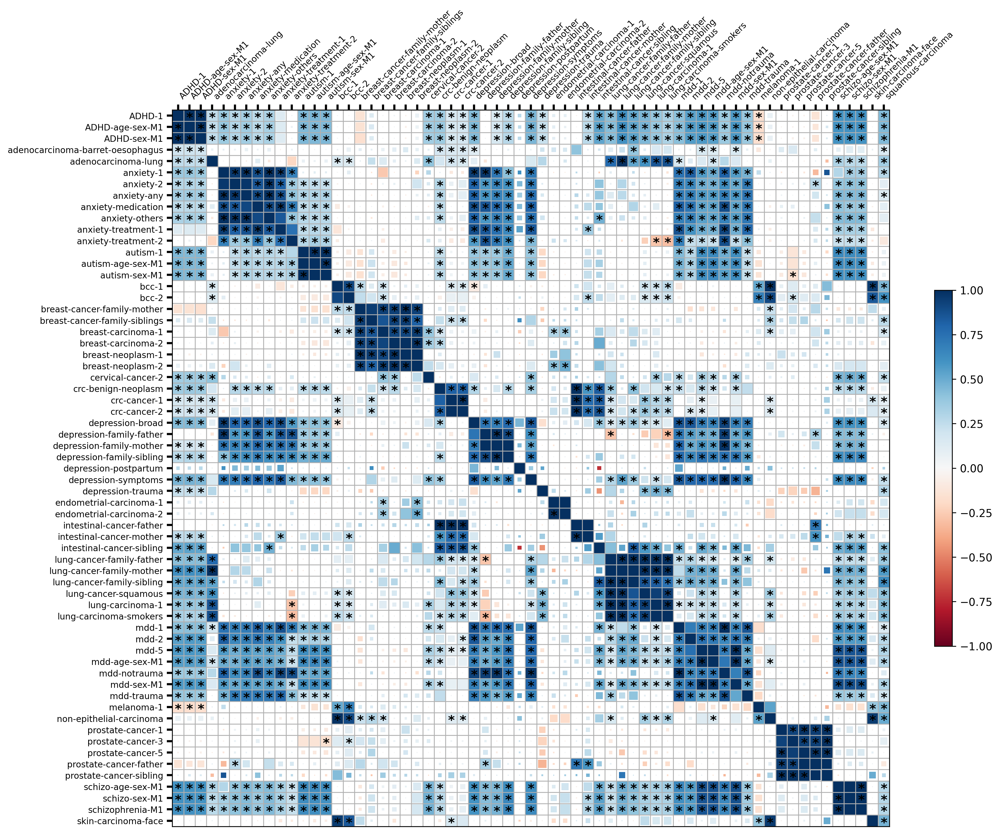

In [59]:
ldsc_heatmap_bh = gl.plot_rg( ldsc,
            p="adjusted_p_bh",
            p1="p1",
            p2="p2", 
            sig_levels=[0.05],
            corrections =["non"],
            full_cell=("non",0.05),
            panno_texts=["*"],
            panno_args={"size":12,"c":"black"},
            fig_args={"figsize":(15,15),"dpi":300},
            colorbar_args={"shrink":0.4},
            fontsize=8
            )

2024/07/01 17:11:31 Start to create ldsc genetic correlation heatmap...
2024/07/01 17:11:31 Raw dataset records: 2016
2024/07/01 17:11:31  -Raw dataset non-NA records: 2016
2024/07/01 17:11:31 Filling diagnal line and duplicated pair for plotting...
2024/07/01 17:11:31  -Diagnal records: 62
2024/07/01 17:11:31 Valid unique trait pairs: 2016
2024/07/01 17:11:31  -Valid unique trait1: 63
2024/07/01 17:11:31  -Valid unique trait2: 63
2024/07/01 17:11:31  -Significant correlations with P < 0.05: 562
2024/07/01 17:11:31  -Significant correlations after Bonferroni correction: 362
2024/07/01 17:11:31  -Significant correlations with FDR <0.05: 502
2024/07/01 17:11:31 Plotting heatmap...
2024/07/01 17:11:31 Full cell : non-corrected P == 0.05


2024/07/01 17:11:33 P value annotation text (Order: Bon -> FDR -> Pnom): 
2024/07/01 17:11:33  -* : non-corrected P < 0.05 
2024/07/01 17:11:33 Start to save figure...
2024/07/01 17:11:33  -Skip saving figure!
2024/07/01 17:11:33 Finished saving figure...
2024/07/01 17:11:33 Finished creating ldsc genetic correlation heatmap!


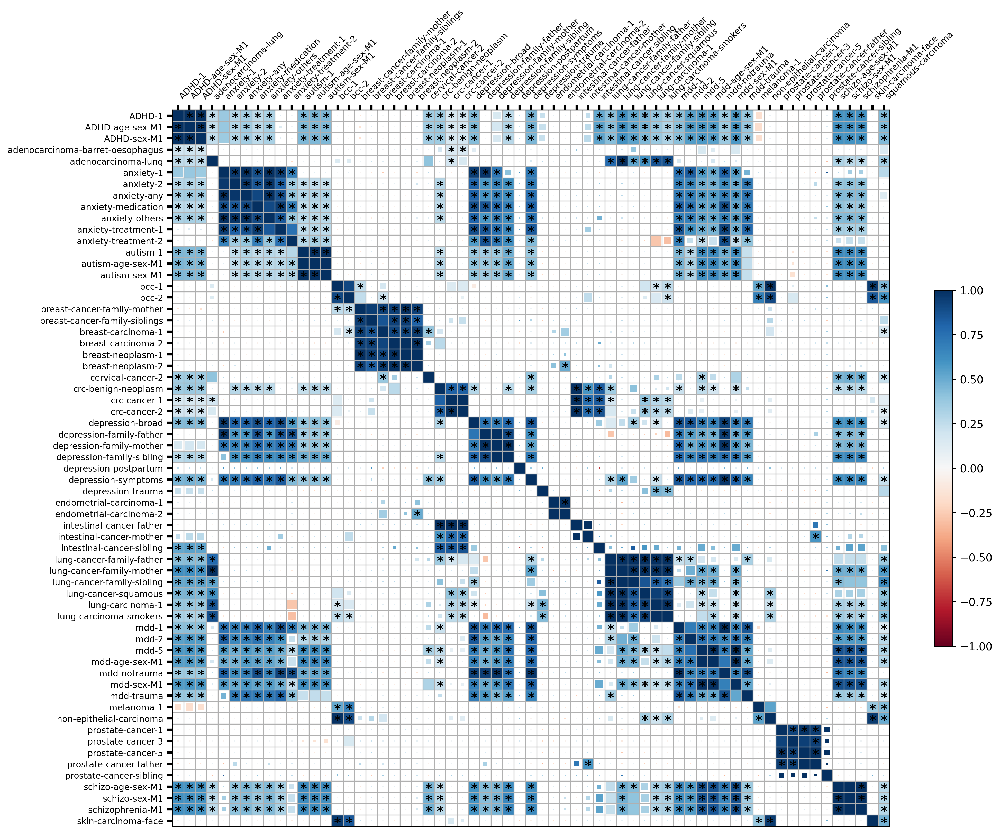

In [60]:
ldsc_heatmap_by = gl.plot_rg( ldsc,
            p="adjusted_p_by",
            p1="p1",
            p2="p2", 
            sig_levels=[0.05],
            corrections =["non"],
            full_cell=("non",0.05),
            panno_texts=["*"],
            panno_args={"size":12,"c":"black"},
            fig_args={"figsize":(15,15),"dpi":300},
            colorbar_args={"shrink":0.4},
            fontsize=8
            )